In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install cuml-cu12

In [3]:
import joblib
import glob
import os
import json
import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
import cuml.ensemble
import seaborn as sns

In [4]:
!pip install kagglehub

In [5]:
path = kagglehub.dataset_download("florianhinrichsen/nyc-taxi-data-2023-24-normalized/version/3")

DO_datasets = {f"{path}/hourlyDOs202324_Normalized.parquet": "DOs",
            f"{path}/hourlyDOs202324WEATHER_Normalized.parquet":"DOsWEATHER",
            f"{path}/hourlyDOs202324CYCLt_Normalized.parquet": "DOsCYCLt",
            f"{path}/hourlyDOs202324WEATHER_CYCLt_Normalized.parquet":"DOsWEATHER_CYCLt"}

PU_datasets ={f"{path}/hourlyPUs202324_Normalized.parquet":"PUs",
            f"{path}/hourlyPUs202324WEATHER_Normalized.parquet":"PUsWEATHER",
            f"{path}/hourlyPUs202324CYCLt_Normalized.parquet":"PUsCYCLt",
            f"{path}/hourlyPUs202324WEATHER_CYCLt_Normalized.parquet":"PUsWEATHER_CYCLt"}

ridge_path = kagglehub.dataset_download("florianhinrichsen/ridgeregression")
ridge_files = glob.glob(ridge_path + "/*.pkl")
rf_path = kagglehub.dataset_download("florianhinrichsen/randomforest")
rf_files = glob.glob(rf_path + "/*.pkl")
nn_path = kagglehub.dataset_download("florianhinrichsen/neuralnetwork")
nn_files = glob.glob(nn_path + "/*.keras")

Using Colab cache for faster access to the 'nyc-taxi-data-2023-24-normalized' dataset.
Using Colab cache for faster access to the 'ridgeregression' dataset.


100%|██████████| 79.5M/79.5M [00:05<00:00, 16.0MB/s]

Extracting files...


Using Colab cache for faster access to the 'neuralnetwork' dataset.


### Plotting Random Forest Results

Line plots

In [6]:
import pandas as pd
import joblib

# -------------------------------------------------------------------------
# Part 1: Generate Predictions for all Drop-Off (DO) Models
# -------------------------------------------------------------------------
# Initialize a master DataFrame to store the actuals and all model predictions side-by-side
DO_results = None

for file in DO_datasets:
    # 1. Data Loading & Preprocessing (Same as Ridge evaluation)
    df = pd.read_parquet(file)

    df = df.rename(columns={df.columns[1]:"date"})
    df = df[df["year"].isin([2023, 2024])]
    df["year"] = df["year"].map({2023: 0, 2024: 1})
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")
    df = df.dropna()

    # Isolate out-of-sample test data (2024 onwards)
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Separate features from target.
    # Note: Unlike the Ridge script, "year" is retained as a feature here.
    X_test = df_test.drop(columns=["trip_count", "date"])

    # 2. Initialize the Results DataFrame (Executes only on the first loop iteration)
    if DO_results is None:
        DO_results = pd.DataFrame({
            "Date": df_test["date"],
            "Actual": df_test["trip_count"]
        }).set_index("Date") # Set date as the index for easy plotting later

    # 3. Model Matching
    # Search the pre-loaded list of Random Forest files (rf_files) for the matching .pkl
    for model in rf_files:
        if f"{DO_datasets[file]}.pkl" in model:
            right_model = model
            break

    # 4. Generate & Store Predictions
    rf_model = joblib.load(right_model)

    # Predict using the model. X_test is cast to float32 to ensure compatibility
    # with tree-based models and optimize memory usage.
    # The results are stored as a new column named after the dataset variant.
    DO_results[f"{DO_datasets[file]}"] = rf_model.predict(X_test.astype("float32")).values


# -------------------------------------------------------------------------
# Part 2: Generate Predictions for all Pick-Up (PU) Models
# -------------------------------------------------------------------------
# Initialize a master DataFrame for Pick-Up predictions
PU_results = None

for file in PU_datasets:
    # 1. Data Loading & Preprocessing
    df = pd.read_parquet(file)

    df = df.rename(columns={df.columns[1]:"date"})
    df = df[df["year"].isin([2023, 2024])]
    df["year"] = df["year"].map({2023: 0, 2024: 1})
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")
    df = df.dropna()

    # Isolate out-of-sample test data
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Define features (X_test)
    X_test = df_test.drop(columns=["trip_count", "date"])

    # 2. Initialize the Results DataFrame (First iteration only)
    if PU_results is None:
        PU_results = pd.DataFrame({
            "Date": df_test["date"],
            "Actual": df_test["trip_count"]
        }).set_index("Date")

    # 3. Model Matching (Random Forest)
    for model in rf_files:
        if f"{PU_datasets[file]}.pkl" in model:
            right_model = model
            break

    # 4. Generate & Store Predictions
    rf_model = joblib.load(right_model)

    # Store predictions as a new column in the PU_results dataframe
    PU_results[f"{PU_datasets[file]}"] = rf_model.predict(X_test.astype("float32")).values

In [7]:
# 1. Reverse the Scaling Transformation
# Since both the "Actual" column and all model prediction columns in the DataFrames
# are in their scaled format, we apply the inverse formulas globally to the entire
# DataFrames. This returns all values to real-world trip counts.
PU_unscaled = (PU_results * 126) + 71
DO_unscaled = (DO_results * 125) + 68

# 2. Aggregate to Monthly Trip Volumes
# The DataFrames are indexed by Date. We group the rows by the month of that index
# (1 through 12) and sum them up. This produces a DataFrame where each row represents
# a month, and columns contain the total actual vs. predicted trips for that month.
PUs_monthly = PU_unscaled.groupby(PU_unscaled.index.month).sum()
DOs_monthly = DO_unscaled.groupby(DO_unscaled.index.month).sum()

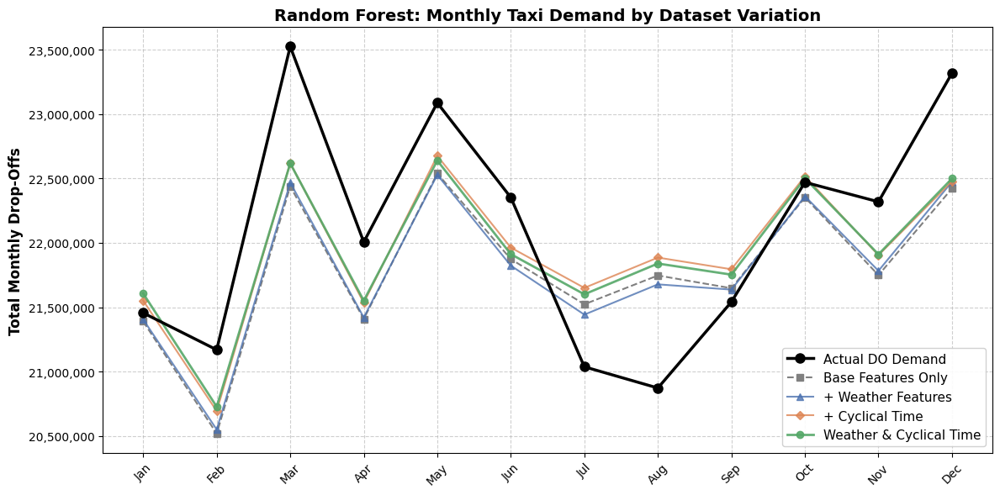

In [8]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


fig, ax = plt.subplots(figsize=(12, 6))

# 1. Plot Ground Truth (Actuals)
# A thick black line with a high zorder (5) guarantees the actual demand
# stays prominently on top of all the prediction lines.
ax.plot(DOs_monthly.index, DOs_monthly['Actual'], label='Actual DO Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# 2. Plot Base Model Predictions
# A dashed gray line establishes the baseline performance (no advanced features)
ax.plot(DOs_monthly.index, DOs_monthly['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# 3. Plot Enhanced Model Predictions
# Distinct colors and marker shapes (triangle, diamond, circle) ensure the variants
# remain distinguishable, even if the thesis is printed in grayscale.
ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(DOs_monthly.index, DOs_monthly['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

# The combined model gets a slightly thicker line (linewidth=2) to emphasize its performance
ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# -------------------------------------------------------------------------
# Formatting & Aesthetics
# -------------------------------------------------------------------------
# Format X-axis: Map the numeric index (1-12) to readable month abbreviations
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)

# Format Y-axis: Apply a custom formatter to add commas to large numbers
# (e.g., formatting 1500000 as 1,500,000) for better readability
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

# Add descriptive labels and a clear title for the evaluation section
ax.set_ylabel('Total Monthly Drop-Offs', fontsize=12, fontweight='bold')
ax.set_title('Random Forest: Monthly Taxi Demand by Dataset Variation', fontsize=14, fontweight='bold')

# Place the legend in the optimal empty space (loc='best') with a slight background opacity
ax.legend(loc='best', fontsize=11, framealpha=0.9)

# Add a subtle grid to make it easier to trace data points to the y-axis
ax.grid(True, linestyle='--', alpha=0.6)


# Adjust layout to ensure the rotated x-axis labels aren't cut off in the saved image
fig.tight_layout()

# Save the plot as a high-resolution PDF, which is ideal for LaTeX/Word documents
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/RFMonthlyDOs.pdf", dpi=300)

plt.show()

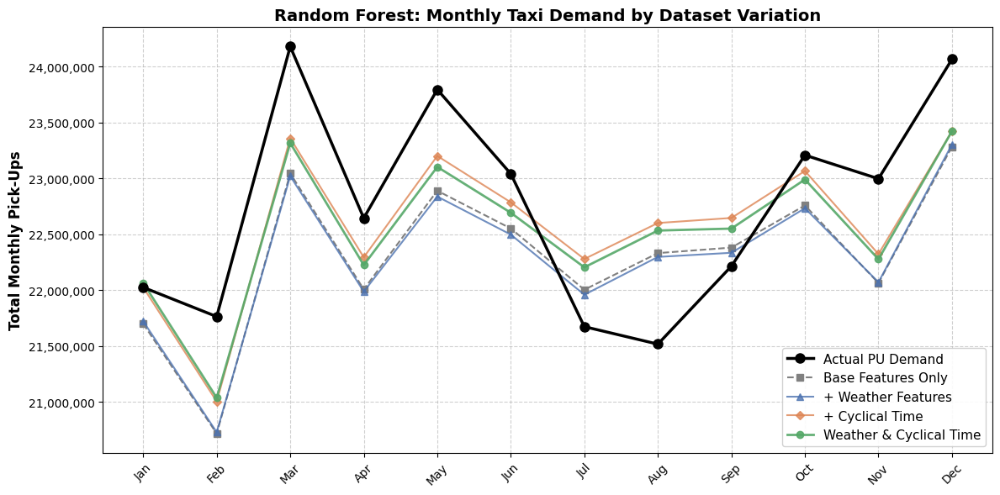

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(12, 6))

# 1. Plot Actual (Thick black line with large circle markers)
ax.plot(PUs_monthly.index, PUs_monthly['Actual'], label='Actual PU Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# 2. Plot Base Model (Dashed gray with square markers)
# Replace 'DOs' with the exact name of your base column
ax.plot(PUs_monthly.index, PUs_monthly['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# 3. Plot Enhanced Datasets (Solid colors with triangle/diamond markers)
ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# Format X-axis to show only the Month and Year (e.g., Jan 2023)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)
plt.xticks(rotation=45)

# Format Y-axis to add commas for large numbers (e.g., 1,500,000)
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

# Labels and Grid
ax.set_ylabel('Total Monthly Pick-Ups', fontsize=12, fontweight='bold')
ax.set_title('Random Forest: Monthly Taxi Demand by Dataset Variation', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9)
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/RFMonthlyPUs.pdf", dpi=300)
plt.show()

In [10]:
PU_daily = PU_unscaled.groupby(PU_unscaled.index.dayofyear).sum()
DO_daily = DO_unscaled.groupby(DO_unscaled.index.dayofyear).sum()

PU_rolling = PU_daily.rolling(window=7).mean()
DO_rolling = DO_daily.rolling(window=7).mean()

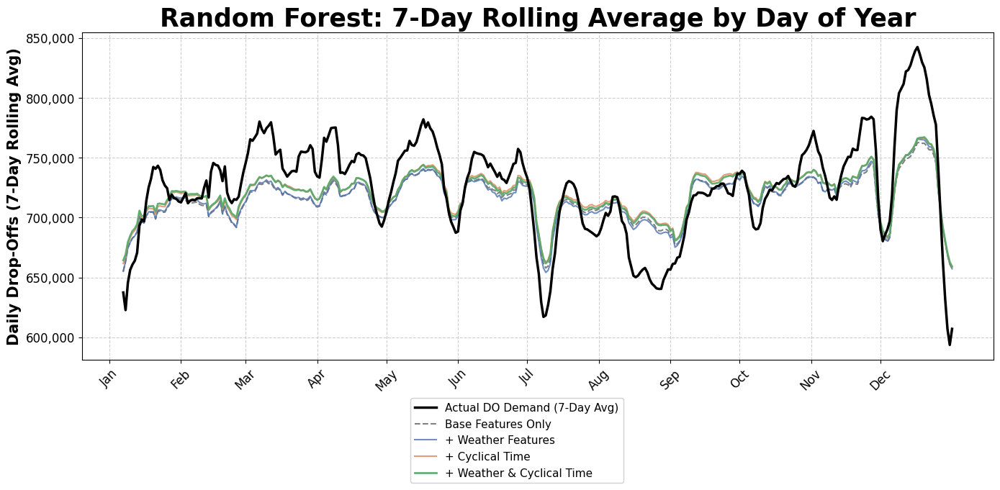

In [11]:
fig, ax = plt.subplots(figsize=(14, 7))

# Actual (Thick black line)
ax.plot(DO_rolling.index, DO_rolling['Actual'], label='Actual DO Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Base Model (Dashed gray)
ax.plot(DO_rolling.index, DO_rolling['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Enhanced Datasets (Solid colors)
ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER_CYCLt'], label='+ Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)

# We manually map the approximate start day of each month for the x-axis
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis with commas
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

ax.tick_params(axis='y', labelsize=12)

# Formatting
ax.set_ylabel('Daily Drop-Offs (7-Day Rolling Avg)', fontsize=15, fontweight='bold')
ax.set_title('Random Forest: 7-Day Rolling Average by Day of Year', fontsize=25, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6,-0.1))
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/RF7DayDOs.pdf", dpi=300)
plt.show()

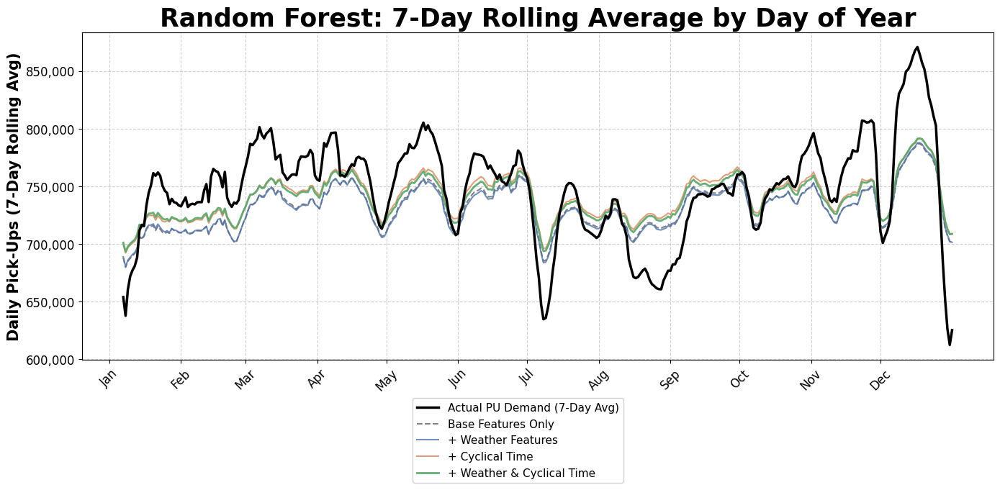

In [12]:
fig, ax = plt.subplots(figsize=(14, 7))

# Actual (Thick black line)
ax.plot(PU_rolling.index, PU_rolling['Actual'], label='Actual PU Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Base Model (Dashed gray)
ax.plot(PU_rolling.index, PU_rolling['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Enhanced Datasets (Solid colors)
ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER_CYCLt'], label='+ Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)

# We manually map the approximate start day of each month for the x-axis
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis with commas
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

ax.tick_params(axis='y', labelsize=12)

# Formatting
ax.set_ylabel('Daily Pick-Ups (7-Day Rolling Avg)', fontsize=15, fontweight='bold')
ax.set_title('Random Forest: 7-Day Rolling Average by Day of Year', fontsize=25, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6,-0.1))
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/RF7DayPUs.pdf", dpi=300)
plt.show()

Scatter plots

In [13]:
PU_filtered = PU_unscaled[(PU_unscaled < 2500).all(axis=1)]
DO_filtered = DO_unscaled[(DO_unscaled < 2500).all(axis=1)]

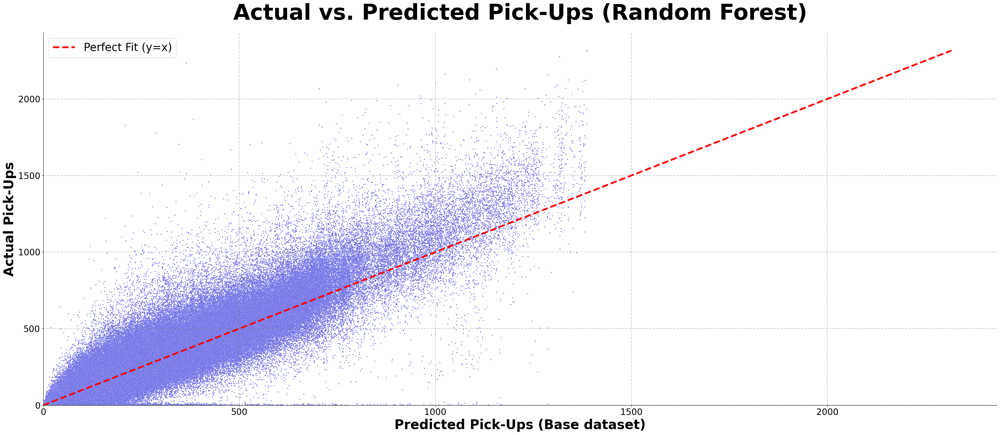

In [14]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title('Actual vs. Predicted Pick-Ups (Random Forest)', fontsize=50, fontweight='bold', pad=30)
plt.ylabel('Actual Pick-Ups', fontweight='bold', fontsize=30)
plt.xlabel('Predicted Pick-Ups (Base dataset)', fontweight='bold', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc='upper left')

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterPUs.pdf", dpi=300)
plt.show()

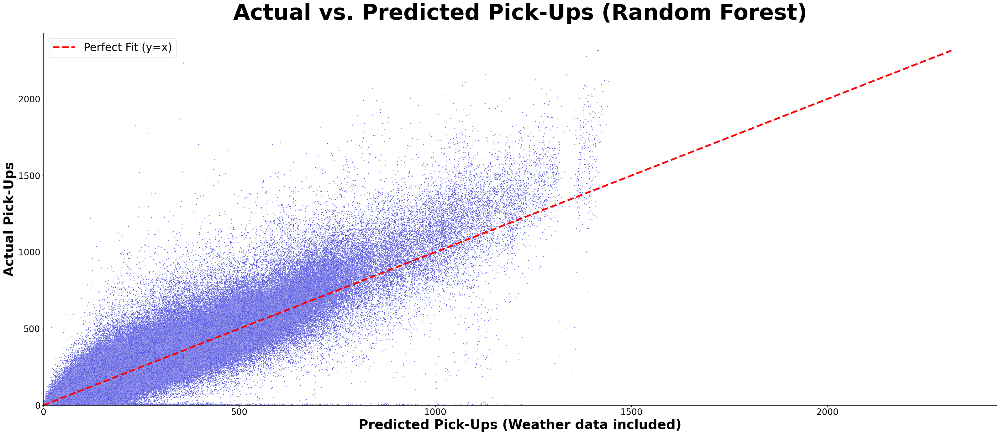

In [15]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterPUsWEATHER.pdf", dpi=300)
plt.show()

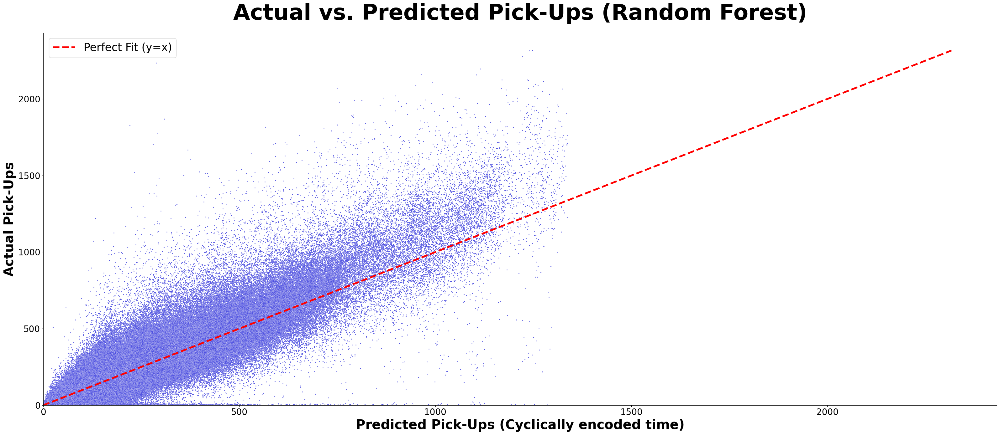

In [16]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterPUsCYCLt.pdf", dpi=300)
plt.show()

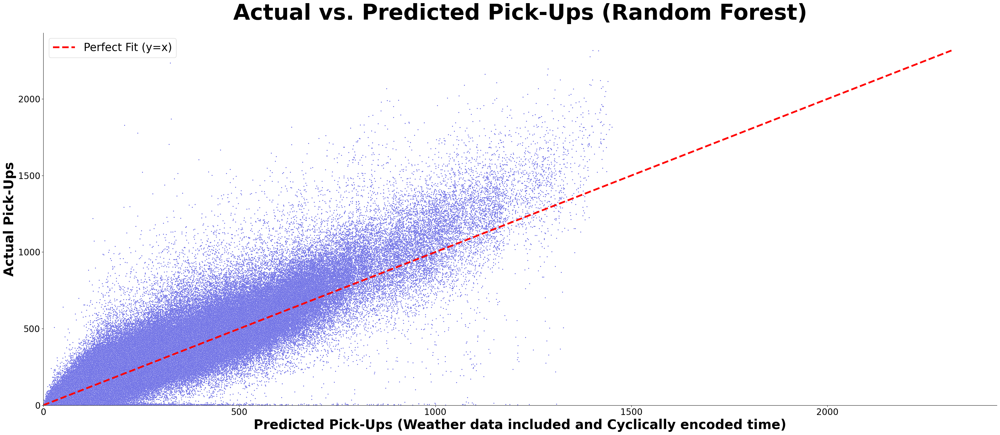

In [17]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

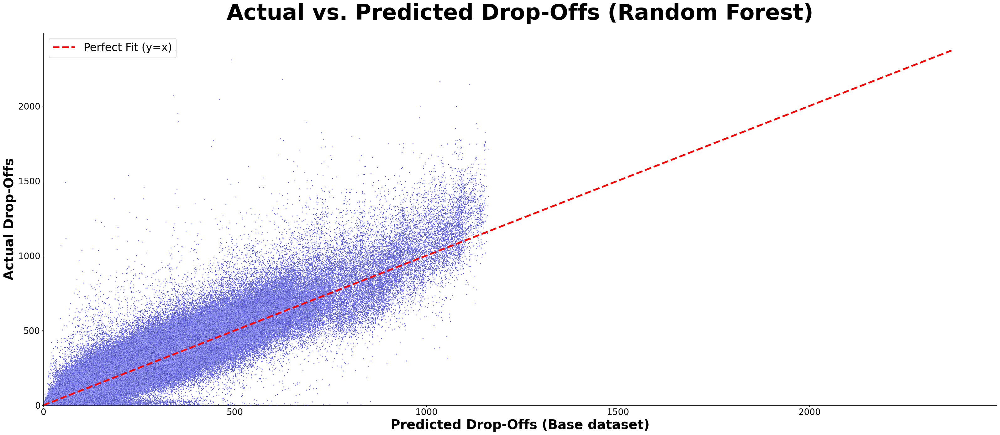

In [18]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterDOs.pdf", dpi=300)
plt.show()

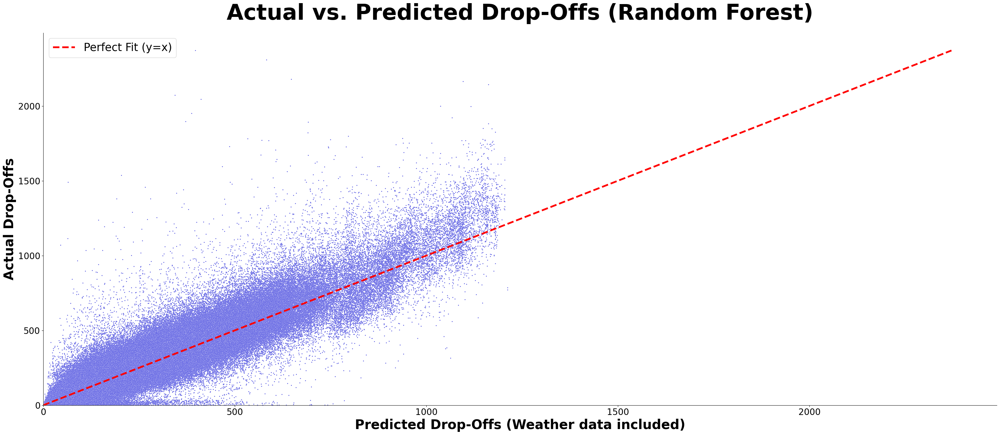

In [19]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterDOsWEATHER.pdf", dpi=300)
plt.show()

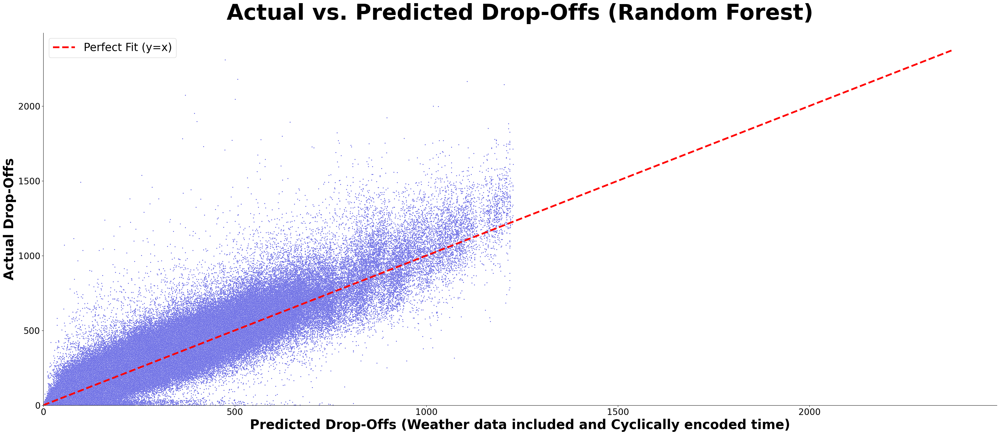

In [20]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

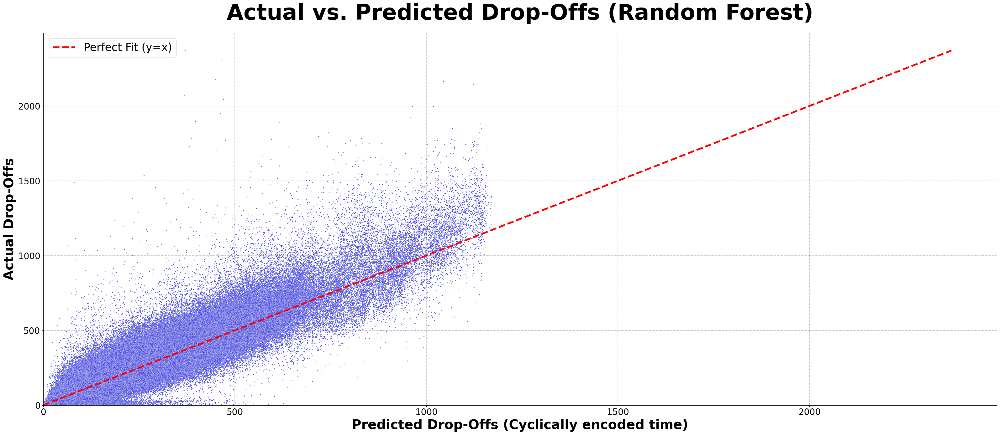

In [21]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFScatterDOsCYCLt.pdf", dpi=300)
plt.show()

Histograms

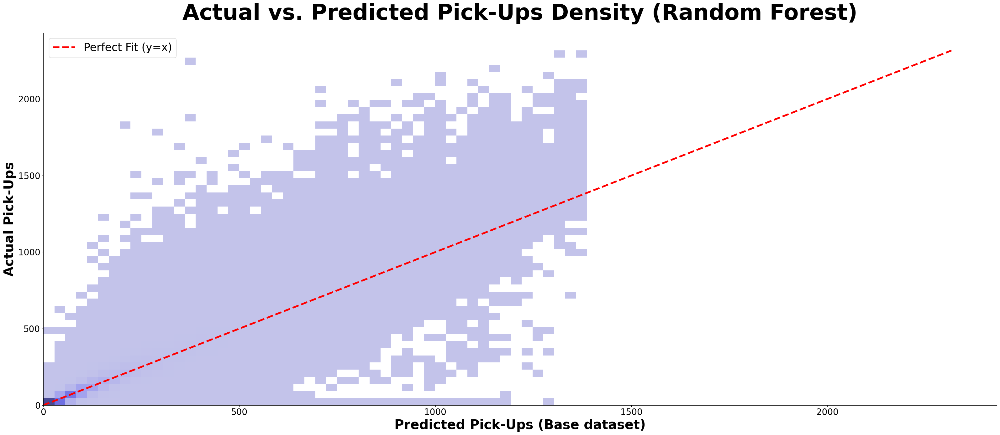

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------------------------------------------------------
# 2D Density Plot: Actual vs. Predicted Pick-Ups (Base Model)
# -------------------------------------------------------------------------

# 1. Extract Data
# Isolate the ground truth (Actual) and the baseline Random Forest predictions (PUs)
# for the visual comparison.
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]

# Set up an exceptionally large figure. This aspect ratio (32x14) and size is
# often used for high-resolution wide-format presentations or detailed poster graphics.
plt.figure(figsize=(32, 14))

# 2. Render 2D Histogram (Density Plot)
# For datasets with hundreds of thousands of rows (like taxi trips), a standard scatter
# plot suffers from severe overplotting (a solid block of color).
# sns.histplot in 2D creates a heatmap of point density, showing where predictions
# are most heavily concentrated.
sns.histplot(
    x=preds,
    y=actuals,
    bins=50,             # Divides the data area into a 50x50 grid of bins
    color="#4C4EE0"      # A strong blue hue for the density blocks
)

# 3. Add the Identity Line (y = x) (AI generated)
# Calculate the absolute maximum value across both actuals and predictions to
# ensure the reference line scales perfectly to the top right corner.
max_val = max(actuals.max(), preds.max())

# Plot the "Perfect Fit" line. If the model predicted perfectly, every single
# bin in the histplot would fall exactly on this dashed red line.
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# 4. Formatting and Typography
# Apply ultra-large font sizes proportionally scaled to the 32x14 figure size
# to ensure readability when the plot is scaled down in the thesis document.
plt.title("Actual vs. Predicted Pick-Ups Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Base dataset)", fontweight="bold", fontsize=30)

# Increase tick label sizes for readability
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

# Lock the axes to start at exactly 0 (prevents matplotlib from adding negative padding)
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove the top and right bounding box lines for a cleaner, modern aesthetic
sns.despine()

# Place the legend in the upper left, away from the main density of data (usually lower-left to mid-right)
plt.legend(fontsize=25, loc="upper left")

# 5. Export and Cleanup
# Tight_layout automatically adjusts subplots to fit into the figure area cleanly
plt.tight_layout()

# Save as a high-resolution, vector-scalable PDF
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistPUs.pdf", dpi=300)
plt.show()

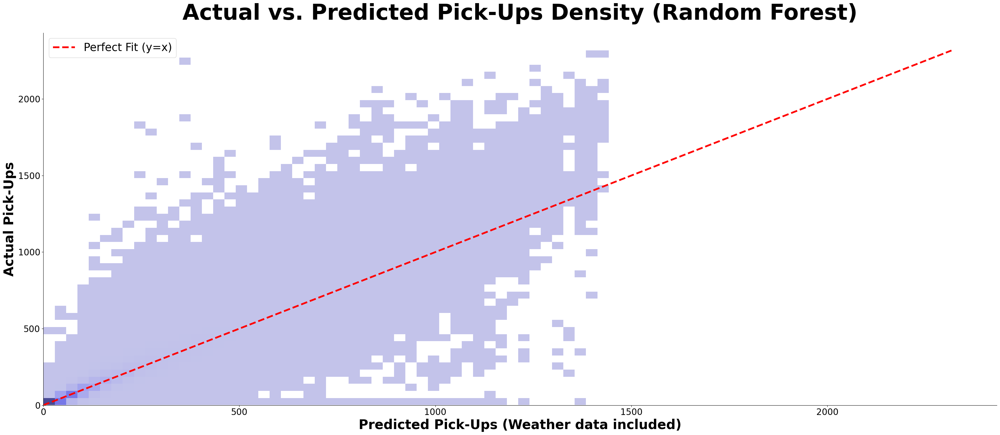

In [23]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistPUsWEATHER.pdf", dpi=300)
plt.show()

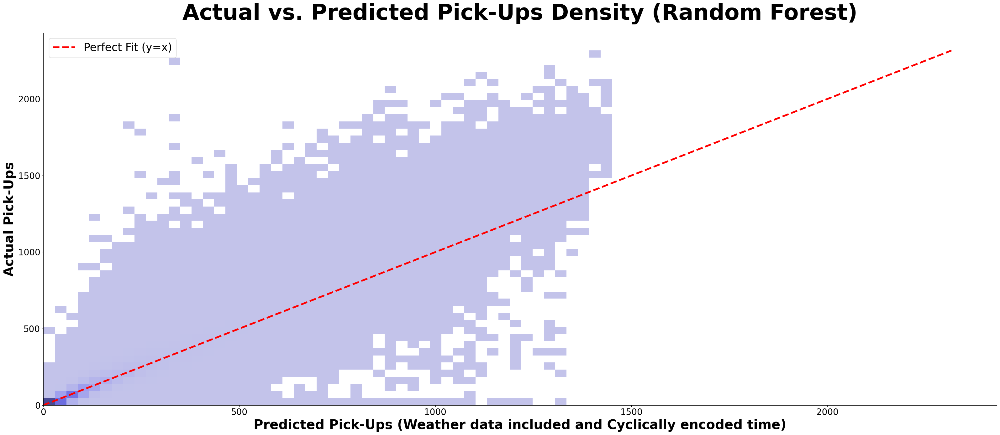

In [24]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

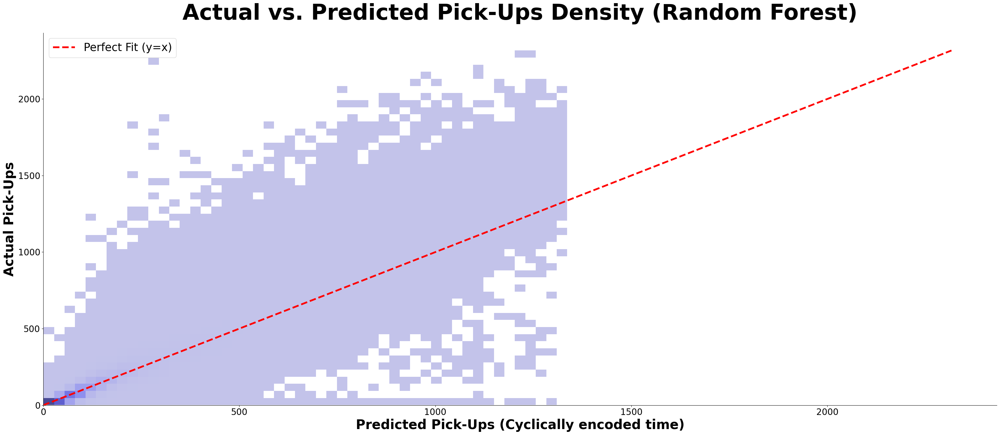

In [25]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistPUsCYCLt.pdf", dpi=300)
plt.show()

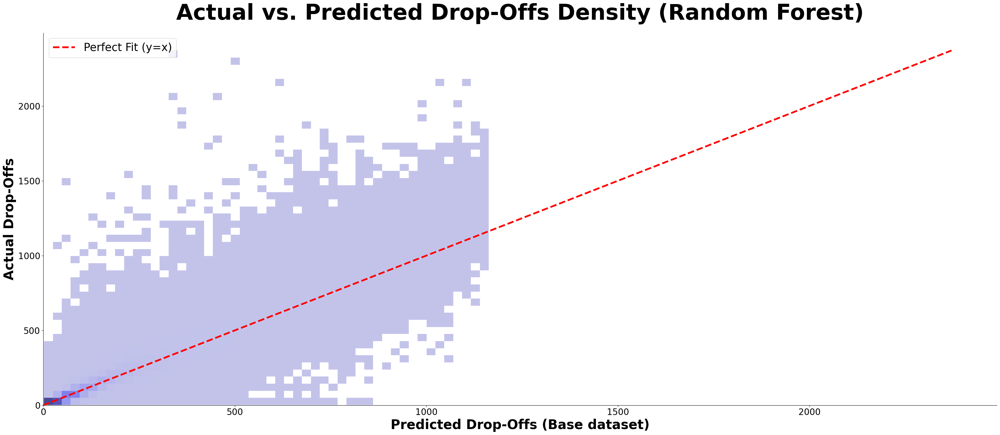

In [26]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistDOs.pdf", dpi=300)
plt.show()

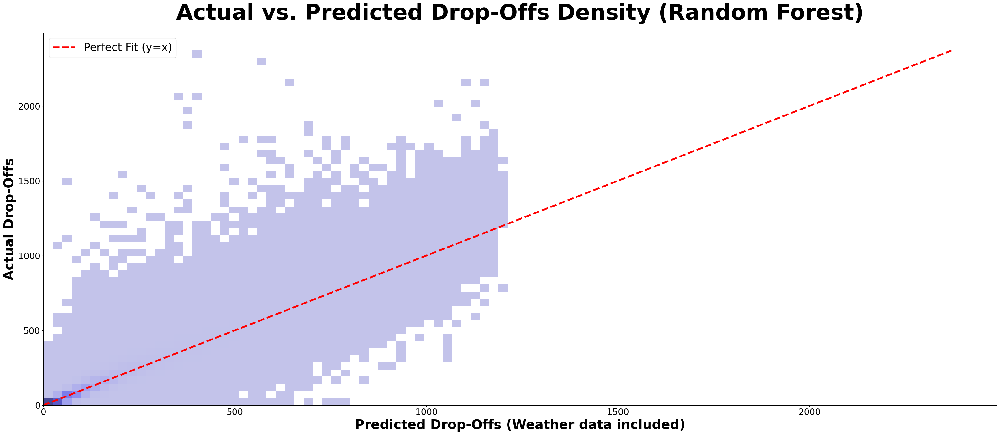

In [27]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistDOsWEATHER.pdf", dpi=300)
plt.show()

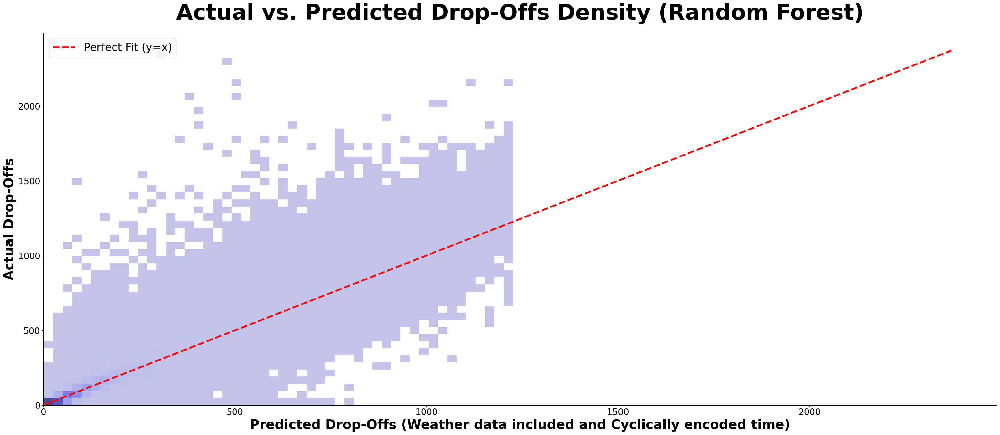

In [28]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

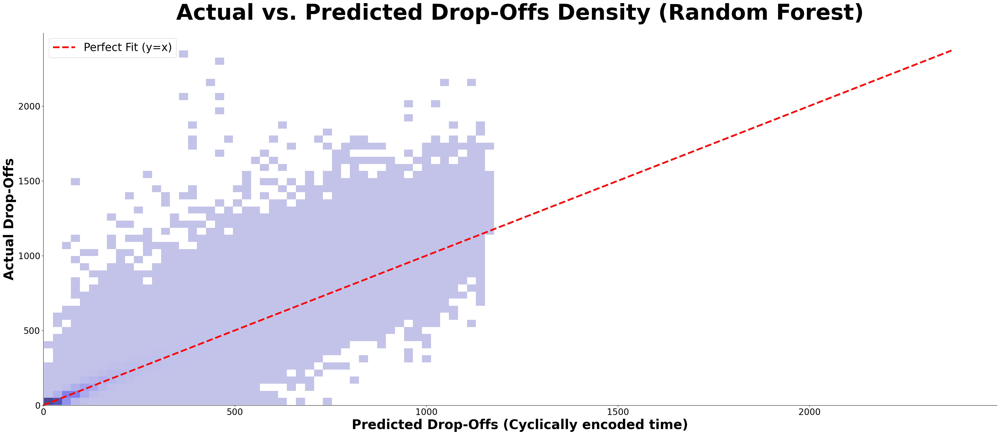

In [29]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

# AI generated:
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Random Forest)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=30)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/Scatter_Hist/RFHistDOsCYCLt.pdf", dpi=300)
plt.show()

Calculating Impurity Feature Importances

In [30]:
import os
import joblib
import pandas as pd

for file in DO_datasets:
    # Read the dataset file
    df = pd.read_parquet(file)

    # Rename the second column in the dataframe to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter the dataframe to only include rows from 2023 and 2024
    df = df[df["year"].isin([2023, 2024])]

    # Replace the year values with binary integers (2023 becomes 0, 2024 becomes 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns, ignoring errors if they do not exist in this variant
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing missing values
    df = df.dropna()

    # Create the test set containing only data from January 1st, 2024 onwards
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Define the feature set (X_test) by dropping the target variable and date
    X_test = df_test.drop(columns=["trip_count", "date"])

    # Find the corresponding model file path for the current dataset
    for model in rf_files:
        if f"{DO_datasets[file]}.pkl" in model:
            right_model = model
            break

    # Load the matching Random Forest model object
    right_model = joblib.load(right_model)

    # Extract the feature importances array from the trained model
    feature_importances = right_model.feature_importances_

    # Create a DataFrame mapping the column names to their importance values
    importance_df = pd.DataFrame({
        "Model": DO_datasets[file],
        "Feature": X_test.columns,
        "Importance": feature_importances
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Random Forrest/RF_FeatureImportances_DOs.csv"

    # If the CSV does not exist, create it and write the headers.
    # If it exists, append the new data to the bottom without rewriting the headers.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)



In [31]:
import os
import joblib
import pandas as pd

for file in PU_datasets:
    # Read the dataset file
    df = pd.read_parquet(file)

    # Rename the second column in the dataframe to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter the dataframe to only include rows from 2023 and 2024
    df = df[df["year"].isin([2023, 2024])]

    # Replace the year values with binary integers (2023 becomes 0, 2024 becomes 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns, ignoring errors if they do not exist in this variant
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing missing values
    df = df.dropna()

    # Create the test set containing only data from January 1st, 2024 onwards
    df_test = df[df["date"] >= pd.to_datetime("2024-01-01")].copy()

    # Define the feature set (X_test) by dropping the target variable and date
    X_test = df_test.drop(columns=["trip_count", "date"])

    # Find the corresponding model file path for the current dataset
    for model in rf_files:
        if f"{PU_datasets[file]}.pkl" in model:
            right_model = model
            break

    # Load the matching Random Forest model object
    right_model = joblib.load(right_model)

    # Extract the feature importances array from the trained model
    feature_importances = right_model.feature_importances_

    # Create a DataFrame mapping the column names to their importance values
    importance_df = pd.DataFrame({
        "Model": PU_datasets[file],
        "Feature": X_test.columns,
        "Importance": feature_importances
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Random Forrest/RF_FeatureImportances_PUs.csv"

    # If the CSV does not exist, create it and write the headers.
    # If it exists, append the new data to the bottom without rewriting the headers.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

Plotting Impurity Featrue Importance

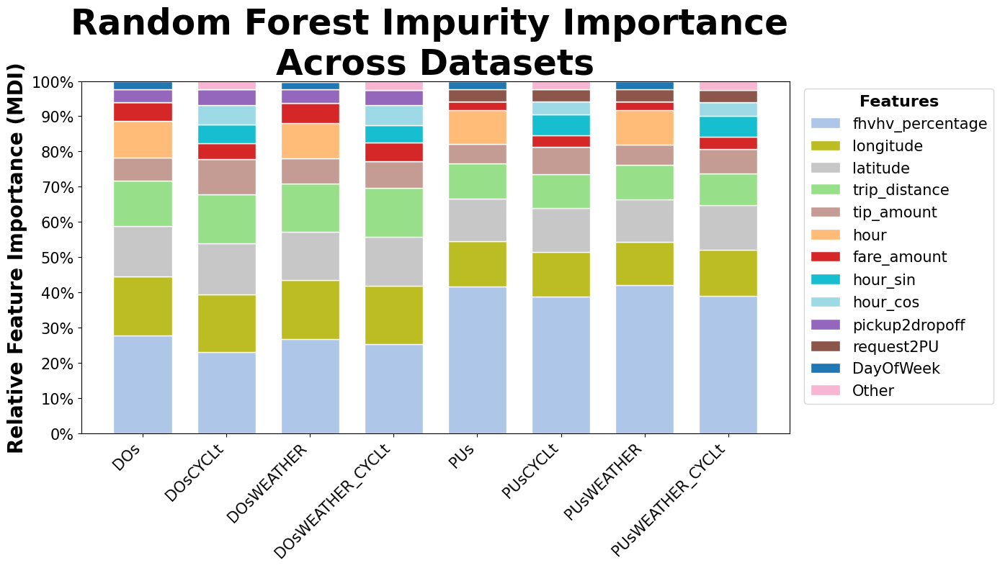

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# This Cell has been generated with AI

# Read the Pick-Up and Drop-Off feature importance CSV files
df_features_PUs = pd.read_csv(rf_path + "/RF_FeatureImportances_PUs.csv")
df_features_DOs = pd.read_csv(rf_path + "/RF_FeatureImportances_DOs.csv")

# Combine the two DataFrames vertically into a single DataFrame
df_features = pd.concat([df_features_PUs,df_features_DOs], ignore_index=True)

# Pivot the DataFrame to set 'Model' as rows and 'Feature' as columns
pivot_df = df_features.pivot(index="Model", columns="Feature", values="Importance")

# Replace NaN values with 0
pivot_df = pivot_df.fillna(0)

# Normalize each row by dividing by the row sum so all importances sum to 1.0
pivot_df = pivot_df.div(pivot_df.sum(axis=1), axis=0)

# Define the minimum threshold for individual feature display
threshold = 0.01

# Calculate the mean importance for each feature across all models
mean_importance = pivot_df.mean()

# Identify features where the mean importance is below the threshold
small_features = mean_importance[mean_importance < threshold].index

# Group small features into a single 'Other' column and drop their original columns
if len(small_features) > 0:
    pivot_df["Other"] = pivot_df[small_features].sum(axis=1)
    pivot_df = pivot_df.drop(columns=small_features)

# Sort the remaining features by mean importance in descending order
if "Other" in pivot_df.columns:
    # Temporarily drop 'Other' to sort the main features, then append 'Other' to the end
    temp_df = pivot_df.drop(columns=["Other"])
    sorted_features = temp_df.mean().sort_values(ascending=False).index.tolist()
    sorted_features.append("Other")
    pivot_df = pivot_df[sorted_features]
else:
    # Sort all features if no 'Other' category was created
    sorted_features = pivot_df.mean().sort_values(ascending=False).index
    pivot_df = pivot_df[sorted_features]

# Create the figure and axes for the plot
fig, ax = plt.subplots(figsize=(14, 8))

# Generate an array of colors from the tab20 colormap matching the number of features
base_colors = plt.cm.tab20(np.linspace(0, 1, len(sorted_features)))

# Shuffle the color array using a fixed random seed to ensure consistent output
rng = np.random.default_rng(seed=10)
shuffled_indices = rng.permutation(len(sorted_features))
colors = base_colors[shuffled_indices]

# Initialize an array of zeros to track the bottom position for the stacked bars
bottom = np.zeros(len(pivot_df))

# Iterate through the sorted features to construct the stacked bar chart
for i, feature in enumerate(sorted_features):
    values = pivot_df[feature].values

    # Plot the current feature segment on top of the previously plotted segments
    ax.bar(
        pivot_df.index,
        values,
        bottom=bottom,
        label=feature,
        edgecolor="white",
        color=colors[i],
        width=0.7
    )

    # Add the current feature values to the bottom array for the next loop iteration
    bottom += values

# Set the y-axis label and plot title
ax.set_ylabel("Relative Feature Importance (MDI)", fontsize=20, fontweight="bold")
ax.set_title("Random Forest Impurity Importance \nAcross Datasets", fontsize=35, fontweight="bold")

# Constrain the y-axis limit from 0 to 1 and format the tick labels as percentages
ax.set_ylim(0, 1)
ax.set_yticks(np.arange(0, 1.1, 0.1))
ax.set_yticklabels([f"{int(x*100)}%" for x in np.arange(0, 1.1, 0.1)], fontsize=15)

# Set the x-axis ticks and format the labels with a 45-degree rotation
ax.set_xticks(np.arange(len(pivot_df.index)))
ax.set_xticklabels(pivot_df.index, rotation=45, ha="right", fontsize=15)

# Place the legend outside the plot box to the right
ax.legend(title="Features", title_fontproperties={"weight":"bold", "size":16}, fontsize=15, bbox_to_anchor=(1.01, 1), loc="upper left")

# Disable the grid lines
ax.grid(False)

# Adjust subplot parameters to fit the figure area and prevent clipping
fig.tight_layout()

# Save the figure as a PDF to the specified directory
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/RF/ImpurityImportances.pdf", dpi=300)

# Display the plot
plt.show()

Calculating Permutation Feature Importance

In [33]:
import os
import joblib
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def RF_scorer_DO(estimator, X, y):
    # Generate predictions using the provided model and features
    y_pred = estimator.predict(X)

    # Reverse the scaling transformation for predictions and actuals
    y_pred_unscaled = (y_pred * 125) + 68
    y_unscaled = (y * 125) + 68

    # Calculate and return the negative Mean Absolute Error using the unscaled values
    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


for file in DO_datasets:
    # Read the parquet file into a DataFrame
    df = pd.read_parquet(file)

    # Rename the second column in the DataFrame to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Keep only the rows where the year is 2023 or 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns from the DataFrame, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Filter the DataFrame to create a test set containing data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Create the feature matrix by dropping 'trip_count' and 'date'
    X_test = df_test.drop(columns=["trip_count","date"])

    # Isolate the target variable 'trip_count'
    y_test = df_test["trip_count"]

    # Get the corresponding dataset string name
    dataset_name = DO_datasets[file]

    # Search through the list of Random Forest file paths to find the matching model
    right_model = None
    for model in rf_files:
        if f"{dataset_name}.pkl" in model:
            right_model = model
            break

    print("1")

    # Load the matched Random Forest model from the file path
    rf_model = joblib.load(right_model)

    # Calculate the baseline score using the unshuffled test data
    baseline = RF_scorer_DO(rf_model, X_test, y_test)

    # Initialize a dictionary and list to track grouped feature columns
    groups = {}
    grouped_cols = []

    # Check for weather columns and group them together
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Check for cyclical time columns and group sine/cosine pairs together
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Iterate through the remaining columns and add them as individual groups
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # Calculate the permutation importance for each grouped feature set
    result = {}
    for name, cols in groups.items():
        drops = []
        # Execute 10 permutation iterations per group
        for i in range(10):
            X_shuff = X_test.copy()

            # Randomly shuffle the rows for the columns in the current group
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Score the model using the shuffled data
            score = RF_scorer_DO(rf_model, X_shuff, y_test)

            # Calculate the difference between the baseline score and the shuffled score
            drops.append(baseline - score)

        # Average the score differences across the 10 iterations
        result[name] = sum(drops) / 10

    # Store the final importance values in a DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Random Forrest/PermutationImportances_DOs.csv"

    # Check if the CSV file exists. If not, create it and write the headers.
    # If it exists, append the new DataFrame rows without writing the header again.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

1
1
1
1


In [34]:
import os
import joblib
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def RF_scorer_PU(estimator, X, y):
    # Generate predictions using the provided model and features
    y_pred = estimator.predict(X)

    # Reverse the scaling transformation for predictions and actuals (multiply by 126, add 71)
    y_pred_unscaled = (y_pred * 126) + 71
    y_unscaled = (y * 126) + 71

    # Calculate and return the negative Mean Absolute Error using the unscaled values
    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


for file in PU_datasets:
    # Read the parquet file into a DataFrame
    df = pd.read_parquet(file)

    # Rename the second column in the DataFrame to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Keep only the rows where the year is 2023 or 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns from the DataFrame, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Filter the DataFrame to create a test set containing data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Create the feature matrix by dropping 'trip_count' and 'date'
    X_test = df_test.drop(columns=["trip_count","date"])

    # Isolate the target variable 'trip_count'
    y_test = df_test["trip_count"]

    # Get the corresponding dataset string name
    dataset_name = PU_datasets[file]

    # Search through the list of Random Forest file paths to find the matching model
    right_model = None
    for model in rf_files:
        if f"{dataset_name}.pkl" in model:
            right_model = model
            break

    print("1")

    # Load the matched Random Forest model from the file path
    rf_model = joblib.load(right_model)

    # Calculate the baseline score using the unshuffled test data
    baseline = RF_scorer_PU(rf_model, X_test, y_test)

    # Initialize a dictionary and list to track grouped feature columns
    groups = {}
    grouped_cols = []

    # Check for weather columns and group them together
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Check for cyclical time columns and group sine/cosine pairs together
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Iterate through the remaining columns and add them as individual groups
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # Calculate the permutation importance for each grouped feature set
    result = {}
    for name, cols in groups.items():
        drops = []
        # Execute 10 permutation iterations per group
        for i in range(10):
            X_shuff = X_test.copy()

            # Randomly shuffle the rows for the columns in the current group
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Score the model using the shuffled data
            score = RF_scorer_PU(rf_model, X_shuff, y_test)

            # Calculate the difference between the baseline score and the shuffled score
            drops.append(baseline - score)

        # Average the score differences across the 10 iterations
        result[name] = sum(drops) / 10

    # Store the final importance values in a DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Random Forrest/PermutationImportances_PUs.csv"

    # Check if the CSV file exists. If not, create it and write the headers.
    # If it exists, append the new DataFrame rows without writing the header again.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

1
1
1
1
